#This notebook presents a solution for a two-class image classification task involving "Field" and "Road" images. The objective is to build and evaluate a deep learning model

##Using the GPU to accelerate execution

### Go to Execution > Modify execution type and check that you are in Python 3 and that the hardware gas pedal is set to "GPU".



In [1]:
!nvidia-smi

Wed Aug  9 06:13:10 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   42C    P8     9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## Import of TensorFlow and other libraries

In [2]:
import cv2
import numpy as np
import os
import pathlib
import sklearn.utils
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.applications import VGG19
from keras.utils import to_categorical


## Download dataset from a git repository

In [3]:
!git clone https://github.com/Ouedraogof/data.git
!ls data
print("***")
!ls -l data/dataset

Cloning into 'data'...
remote: Enumerating objects: 209, done.
remote: Counting objects: 100% (209/209), done.
remote: Compressing objects: 100% (204/204), done.
remote: Total 209 (delta 3), reused 208 (delta 2), pack-reused 0
Receiving objects: 100% (209/209), 23.06 MiB | 10.65 MiB/s, done.
Resolving deltas: 100% (3/3), done.
dataset
***
total 16
drwxr-xr-x 2 root root 4096 Aug  9 06:13 fields
drwxr-xr-x 2 root root 4096 Aug  9 06:13 new_test_images
drwxr-xr-x 2 root root 4096 Aug  9 06:13 roads
drwxr-xr-x 2 root root 4096 Aug  9 06:13 test_images


## Data Loading and Labeling
In this section, we outline the process of loading and labeling the dataset for our image classification task. The data is organized in subfolders corresponding to the different classes ("fields" and "roads"). We will use these subfolder names to assign labels to the images, facilitating supervised learning.


In [4]:
label_names = ["fields", "roads"]
label_to_index = {l: i for i, l in enumerate(label_names)}

def get_images(dir_path: pathlib.Path, shuffle: bool = True
              ) :
    images = []
    labels = []
    file_paths  = []

    # Iterate on the "fields" and "roads" sub-folders
    for subdir_name in ["fields", "roads"]:
        subdir_path = dir_path / subdir_name

        # Assign the right label according to the folder name
        label = label_to_index[subdir_name]

        # We add each image of the current label (folder) to our dataset
        for image_path in subdir_path.iterdir():
            # Using OpenCV to load the image
            image = cv2.imread(str(image_path))
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            # All CNN input images must be the same size
            image = cv2.resize(image, (224, 224))
            images.append(image)
            labels.append(label)
            file_paths.append(image_path)
    images, labels, file_paths = map(np.array, [images, labels, file_paths])

    # shuffle arrays
    if shuffle:
        images, labels, file_paths = sklearn.utils.shuffle(images, labels, file_paths)
    return images, labels, file_paths
images, labels, file_paths = get_images(pathlib.Path("data") / "dataset")

### loading test images and new_test_images

In [5]:
def load_test_images(dir_path: pathlib.Path):
    images = []

# Iterate over image files in folder
    for image_path in dir_path.iterdir():
      # Load image with OpenCV
        image = cv2.imread(str(image_path))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        # Resize image
        image = cv2.resize(image, (224, 224))
        images.append(image)

# Convert image list to numpy array
    images = np.array(images)
    return images
# Applying the function to our case
test_images = load_test_images(pathlib.Path("data") / "dataset"/"test_images")
new_test_images = load_test_images(pathlib.Path("data") / "dataset"/"new_test_images")

### visualize label distribution

Image shape : (153, 224, 224, 3)
Label shape : (153,)
Path shape : (153,)


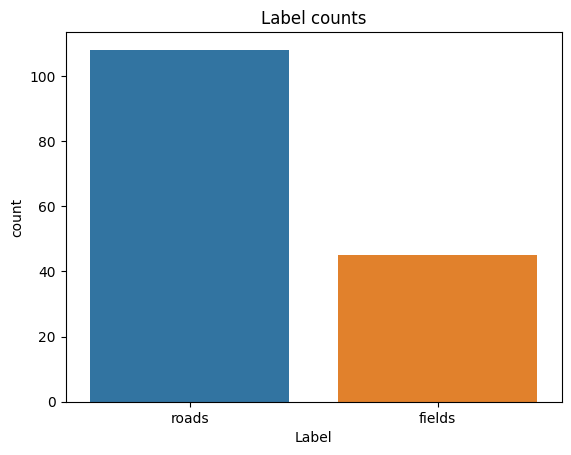

In [6]:
#%%
print(f"Image shape : {images.shape}")
print(f"Label shape : {labels.shape}")
print(f"Path shape : {file_paths.shape}")

sns.countplot(x=[label_names[i] for i in labels])
plt.title("Label counts")
plt.ylabel("count")
plt.xlabel("Label")
plt.show()
#%%

### Display random images with labels from the dataset

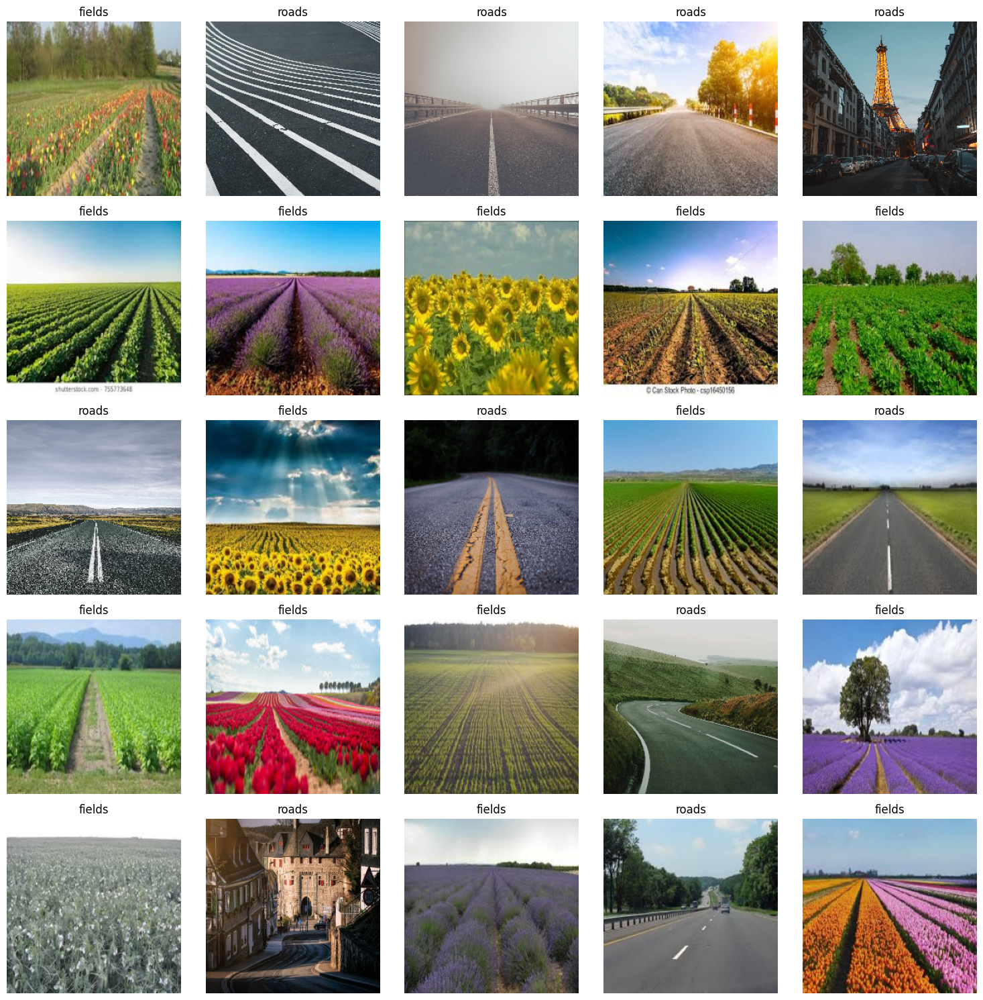

In [7]:
def display_random_images(images, labels, label_names, num_rows=5, num_cols=5, figsize=(15, 15)):
    plt.figure(figsize=figsize)

    random_indexes = np.random.choice(images.shape[0],
                                      size=(num_rows, num_cols),
                                      replace=False)

    for i in range(num_rows):
        for j in range(num_cols):
            img_index = random_indexes[i, j]
            image = images[img_index]
            label = label_names[labels[img_index]]
            plt.subplot(num_rows, num_cols, i * num_cols + j + 1)
            plt.imshow(image)
            plt.title(f"{label}")
            plt.axis('off')

    plt.tight_layout()
    plt.show()

# Call the function with your data
display_random_images(images, labels, label_names)


# Transfer Learning for Binary Image Classification
In this code section, we implement a transfer learning approach for binary image classification.
We use a pre-trained VGG19 model with weights from the ImageNet dataset and build a custom classification model on top of it.
The VGG19 model's convolutional layers have been pre-trained to extract hierarchical features from images (ImageNet, around 1.4 million images in over 20000 categories)

In [12]:
# Convert labels to categorical format
labels_categorical = to_categorical(labels)
# Load pre-trained VGG19 model with ImageNet weights
base_model = VGG19(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze base model layers to avoid updating weights during training ( cucrent strategy for exploiting the benefits of previously learned features )
for layer in base_model.layers:
    layer.trainable = False

# model creation by adding layers on top of the base model
model = models.Sequential()
model.add(base_model)
model.add(layers.Flatten())
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dropout(0.5))
# Output layer for binary classification
model.add(layers.Dense(2, activation='softmax'))

# Compile the model
# Adam automatically adapts the learning rate based on gradient information
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Display a summary of the model
model.summary()

# Train the model
history = model.fit(images, labels_categorical, epochs=10, validation_split=0.2, batch_size=32)
model.save('trained_model.h5')

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg19 (Functional)          (None, 7, 7, 512)         20024384  
                                                                 
 flatten_1 (Flatten)         (None, 25088)             0         
                                                                 
 dense_2 (Dense)             (None, 64)                1605696   
                                                                 
 dropout_1 (Dropout)         (None, 64)                0         
                                                                 
 dense_3 (Dense)             (None, 2)                 130       
                                                                 
Total params: 21,630,210
Trainable params: 1,605,826
Non-trainable params: 20,024,384
_________________________________________________________________
Epoch 1/10
4/4 [==================

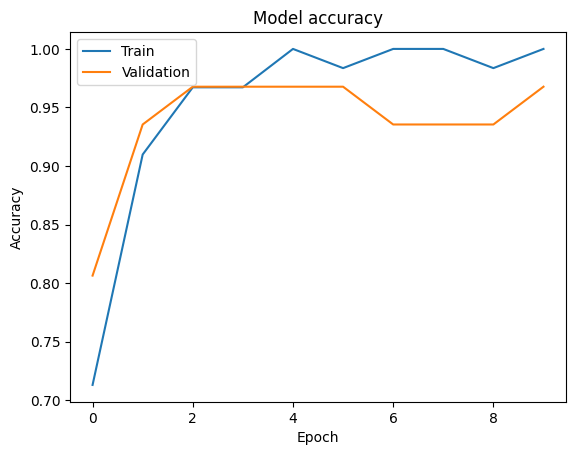

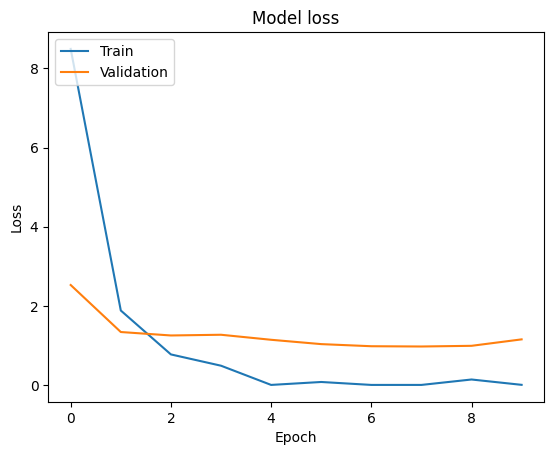

In [13]:
# Plot training & validation accuracy values
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

## Predictions and visualization

In this section, we focus on predicting classes for test images using the trained model, and then visualizing a selection of these images with the corresponding predicted labels. This process provides valuable information on our model's ability to adapt to new and novel data.

1/1 [==============================] - 2s 2s/step


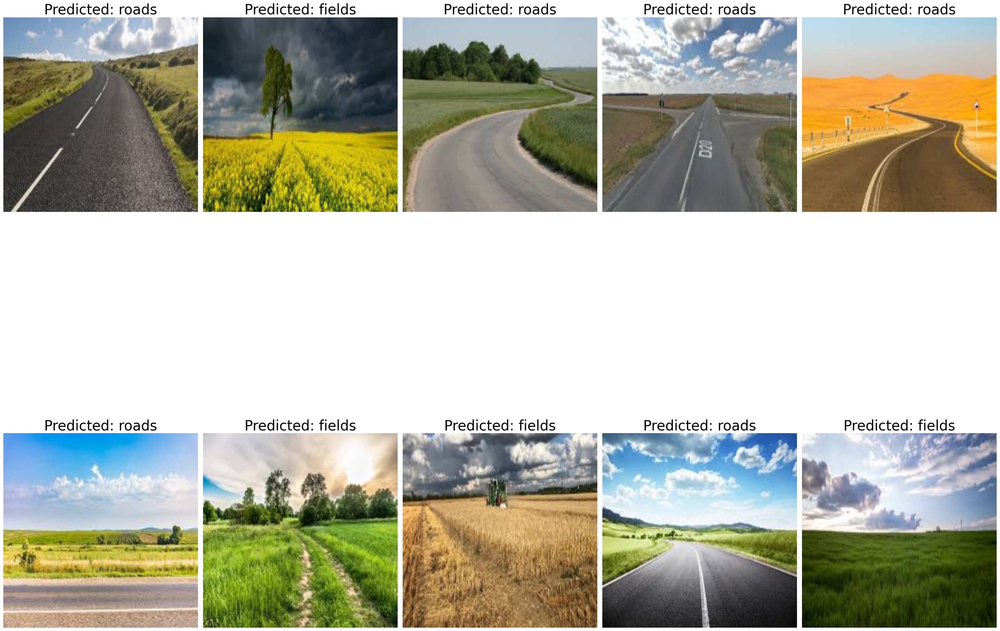

In [10]:
# Predict test data
def predict_classes(test_images):
    predictions = model.predict(test_images)
    predicted_classes = predictions.argmax(axis=1)
    return predicted_classes

def display_images_with_predictions(test_images, predicted_classes, label_names=None, n_to_plot = len(test_images)):
    plt.figure(figsize=(30, 40))

    for i in range(n_to_plot):
        plt.subplot((len(test_images)//5) +1, 5, i + 1)
        plt.imshow(test_images[i])
        predicted_label = label_names[predicted_classes[i]] if label_names else predicted_classes[i]
        plt.title(f"Predicted: {predicted_label}", fontsize= 30)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Using the functions
predicted_classes = predict_classes(test_images)
n_to_plot = min(len(test_images),20)
display_images_with_predictions(test_images, predicted_classes, label_names, n_to_plot)


#Prédictions with new test data

2/2 [==============================] - 1s 775ms/step


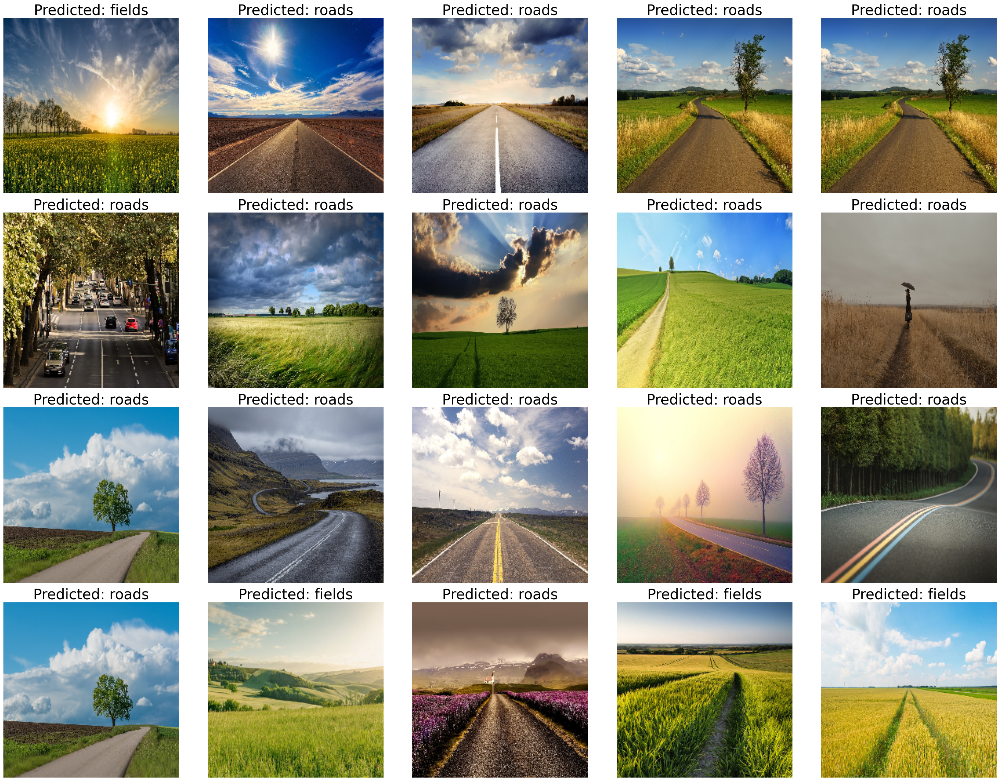

In [11]:
# Using the functions
predicted_classes = predict_classes(new_test_images)
n_to_plot = min(len(new_test_images),20)
display_images_with_predictions(new_test_images, predicted_classes, label_names, n_to_plot)